# 1. Library loading

In [21]:
library(Seurat)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following objects are masked from ‘package:base’:

    intersect, t




In [22]:
library(tidyverse)

In [23]:
library(omnideconv)

Loading required package: snowfall

Loading required package: snow

→ checking omnideconv environment and dependencies



In [24]:
library(readxl)
library(ggpubr)

# 2. Single cell data

In [5]:
library(anndata)

adata <- read_h5ad("/nfs/data/COST_IBD/data/atopic_dermatitis/anndata/bangert.h5ad")

data_matrix <- adata$X

rownames(data_matrix) <- adata$obs_names
colnames(data_matrix) <- adata$var_names

data_matrix <- t(data_matrix)

seurat_object <- CreateSeuratObject(counts = data_matrix, 
                                    assay = "RNA", 
                                    project = "Bangert", 
                                    min.cells = 0, 
                                    min.features = 1)

saveRDS(seurat_object, "bangert.rds")



Attaching package: ‘anndata’


The following object is masked from ‘package:readxl’:

    read_excel


The following object is masked from ‘package:SeuratObject’:

    Layers


Warning message:
“Data is of class dgRMatrix. Coercing to dgCMatrix.”


In [13]:
seurat_object <- readRDS("/nfs/data/COST_IBD/data/atopic_dermatitis/deconvolution/bangert.rds")

In [14]:
seurat_object 

An object of class Seurat 
36601 features across 306537 samples within 1 assay 
Active assay: RNA (36601 features, 0 variable features)
 1 layer present: counts

# 3.Metadata

In [ ]:
data <- read.csv("/nfs/data/COST_IBD/data/atopic_dermatitis/annotations_kamila/updated_annotations.csv", stringsAsFactors = FALSE, skip=2)
head(data)

filtered_data <- data %>%
  filter(grepl("bangert", index))

head(filtered_data)


write.csv(filtered_data, "/nfs/data/COST_IBD/data/atopic_dermatitis/deconvolution/filtered_bangert_updated.csv", row.names = FALSE)


,index,kamila_annotation,kamila_annotation_2
,<chr>,<chr>,<chr>
1,rindler_AD20_AAACGAATCACAGTGT-1,Th,Th
2,rindler_AD20_AAACGCTGTCCTTGTC-1,melanocytes,melanocytes
3,rindler_AD20_AAAGGATGTCGTCTCT-1,cDC2,cDC
4,rindler_AD20_AAATGGAGTATCGAAA-1,ker_spinous,ker_differentiating
5,rindler_AD20_AACAACCCAAATGGAT-1,ker_spinous,ker_differentiating
6,rindler_AD20_AACAACCTCGTAACCA-1,cDC2,cDC


,index,kamila_annotation,kamila_annotation_2
,<chr>,<chr>,<chr>
1,bangert_P115_HC2_AAACCTGAGAAGGCCT-1,VEC_capillary_C2,VEC_capillary
2,bangert_P115_HC2_AAACCTGAGCCCAGCT-1,fib_B,fibroblasts_B
3,bangert_P115_HC2_AAACCTGAGTGTGAAT-1,SMC_arrector_pili,pericytes
4,bangert_P115_HC2_AAACCTGCACATCCAA-1,VEC_venules,VEC_venules
5,bangert_P115_HC2_AAACCTGCAGACGCAA-1,LEC,LEC
6,bangert_P115_HC2_AAACCTGCAGGCAGTA-1,fib_reticular,fibroblasts_B


In [15]:
metadata <- read.csv("/nfs/data/COST_IBD/data/atopic_dermatitis/deconvolution/filtered_bangert_updated.csv", header = TRUE, stringsAsFactors = FALSE)

colnames(metadata) <- c("CellID", "CellType_old", "CellType")
metadata <- metadata %>% select(-CellType_old)
metadata$CellID <- gsub("bangert_", "", metadata$CellID) 

head(metadata)


,CellID,CellType
,<chr>,<chr>
1,P115_HC2_AAACCTGAGAAGGCCT-1,VEC_capillary
2,P115_HC2_AAACCTGAGCCCAGCT-1,fibroblasts_B
3,P115_HC2_AAACCTGAGTGTGAAT-1,pericytes
4,P115_HC2_AAACCTGCACATCCAA-1,VEC_venules
5,P115_HC2_AAACCTGCAGACGCAA-1,LEC
6,P115_HC2_AAACCTGCAGGCAGTA-1,fibroblasts_B


In [16]:
metadata <- metadata %>% filter(CellType != "unassigned")

head(metadata)


,CellID,CellType
,<chr>,<chr>
1,P115_HC2_AAACCTGAGAAGGCCT-1,VEC_capillary
2,P115_HC2_AAACCTGAGCCCAGCT-1,fibroblasts_B
3,P115_HC2_AAACCTGAGTGTGAAT-1,pericytes
4,P115_HC2_AAACCTGCACATCCAA-1,VEC_venules
5,P115_HC2_AAACCTGCAGACGCAA-1,LEC
6,P115_HC2_AAACCTGCAGGCAGTA-1,fibroblasts_B


In [17]:
missing_cells <- setdiff(colnames(seurat_object), metadata$CellID)

seurat_obj_filtered <- subset(seurat_object, cells = colnames(seurat_object)[!colnames(seurat_object) %in% missing_cells])


In [18]:
head(seurat_obj_filtered)

,orig.ident,nCount_RNA,nFeature_RNA
,<fct>,<dbl>,<int>
P115_HC2_AAACCTGAGAAGGCCT-1,P115,2494,1129
P115_HC2_AAACCTGAGCCCAGCT-1,P115,5265,1847
P115_HC2_AAACCTGAGTGTGAAT-1,P115,4961,1854
P115_HC2_AAACCTGCACATCCAA-1,P115,2294,1196
P115_HC2_AAACCTGCAGACGCAA-1,P115,2318,1093
P115_HC2_AAACCTGCAGGCAGTA-1,P115,3285,1527
P115_HC2_AAACCTGCAGTAAGAT-1,P115,5016,1922
P115_HC2_AAACCTGCATATGGTC-1,P115,9171,2862
P115_HC2_AAACCTGTCAACGCTA-1,P115,3854,1749


In [19]:
seurat_obj_filtered <- AddMetaData(seurat_obj_filtered, metadata = metadata)

head(seurat_obj_filtered@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,CellID,CellType
,<fct>,<dbl>,<int>,<chr>,<chr>
P115_HC2_AAACCTGAGAAGGCCT-1,P115,2494,1129,P115_HC2_AAACCTGAGAAGGCCT-1,VEC_capillary
P115_HC2_AAACCTGAGCCCAGCT-1,P115,5265,1847,P115_HC2_AAACCTGAGCCCAGCT-1,fibroblasts_B
P115_HC2_AAACCTGAGTGTGAAT-1,P115,4961,1854,P115_HC2_AAACCTGAGTGTGAAT-1,pericytes
P115_HC2_AAACCTGCACATCCAA-1,P115,2294,1196,P115_HC2_AAACCTGCACATCCAA-1,VEC_venules
P115_HC2_AAACCTGCAGACGCAA-1,P115,2318,1093,P115_HC2_AAACCTGCAGACGCAA-1,LEC
P115_HC2_AAACCTGCAGGCAGTA-1,P115,3285,1527,P115_HC2_AAACCTGCAGGCAGTA-1,fibroblasts_B


In [20]:
table(metadata$CellType, dnn = list("celltype")) %>%
      as.data.frame(., responseName = "number_cells")

celltype,number_cells
<fct>,<int>
cDC,8211
fibroblasts_A,17939
fibroblasts_B,9041
fibroblasts_C,1512
ILC,235
ker_differentiating,36722
ker_proliferating,22051
Langerhans_cells,206
LEC,2930


In [21]:
is_outlier <- function(SeuratObject, metric, nmads){
  eval(parse(text = paste0("M <- SeuratObject$",metric)))
  outlier <- (M < median(M) - nmads * mad(M)) | (M > median(M) + nmads * mad(M))
  return(outlier)
}

check_outliers_nFeature <- is_outlier(seurat_obj_filtered, 'nFeature_RNA', 5)
check_outliers_nCount <- is_outlier(seurat_obj_filtered, 'nCount_RNA', 5)
#check_outliers_mito <- is_outlier(seurat_obj_filtered, 'percent.mito', 3)

non_outliers_nFeature <- names(check_outliers_nFeature[!check_outliers_nFeature])
non_outliers_nCount <- names(check_outliers_nCount[!check_outliers_nCount])
#non_outliers_mito <- names(check_outliers_mito[!check_outliers_mito])

In [22]:
non_outliers <- intersect(non_outliers_nFeature, non_outliers_nCount)

seurat_obj_filtered <- subset(seurat_obj_filtered, cells = non_outliers)

as.data.frame(table(seurat_obj_filtered$CellType, dnn = list("celltype")), responseName = "number_cells")

celltype,number_cells
<fct>,<int>
cDC,8203
fibroblasts_A,17894
fibroblasts_B,9036
fibroblasts_C,1479
ILC,235
ker_differentiating,31639
ker_proliferating,19382
Langerhans_cells,206
LEC,2877


# 4. Bulk data

In [23]:
bulk.data <- read.table('/nfs/data/COST_IBD/data/atopic_dermatitis/datasets/Bulk_RNAseq/Hu/Hu.tsv', 
                        skip = 1, header = FALSE, sep = "\t", skipNul = TRUE, fill = TRUE)

header <- read.table('/nfs/data/COST_IBD/data/atopic_dermatitis/datasets/Bulk_RNAseq/Hu/Hu.tsv', 
                     header = FALSE, nrows = 1, sep = "\t", skipNul = TRUE)

colnames(bulk.data) <- c('gene_name', header[2:length(header)])

bulk.data <- bulk.data[bulk.data$gene_name != '', ]

bulk.data <- column_to_rownames(bulk.data, 'gene_name')
bulk.data <- as.matrix(bulk.data)


In [24]:
head(bulk.data)

,01_AD_02_LS_01,01_AD_04_LS_01,01_AD_04_NL_02,01_AD_05_LS_01,01_AD_05_LS_02,01_AD_05_NL_01,01_AD_06_NL_02,01_AD_07_LS_02,01_AD_08_LS_02,01_AD_09_NL_01,⋯,01_CO_45_HC_01,01_CO_52_HC_02,02_AD_06_NL_02,02_CO_41_HC_02,02_CO_42_HC_02,03_AD_22_NL_02,03_CO_46_HC_02,04_AD_12_LS_01,04_AD_12_LS_02,05_CO_46_HC_01
MIR6859-1,5,2,5,0,0,1,5,2,1,1,⋯,3,1,1,2,0,0,4,5,7,0
U6,18,10,16,5,12,8,13,14,12,0,⋯,6,16,17,0,13,17,33,32,0,10
LINC01409,43,41,57,31,33,36,59,26,48,0,⋯,41,59,75,70,47,45,78,65,99,56
FAM87B,15,6,10,6,5,6,12,17,6,1,⋯,10,14,7,0,20,1,4,28,0,3
LINC01128,263,304,320,409,247,255,363,239,278,1604,⋯,322,216,218,237,275,274,536,197,625,216
LINC00115,58,40,66,36,12,47,54,19,39,0,⋯,40,46,97,159,70,48,81,26,0,62


In [25]:
mapping <- read.table("mapping.tsv", header = FALSE, sep = "\t", stringsAsFactors = FALSE, col.names = c("GSM", "Name"))

In [26]:
original_colnames <- colnames(bulk.data)

gsm_names <- mapping$GSM[match(original_colnames, mapping$Name)]

colnames(bulk.data) <- gsm_names

In [27]:
head(bulk.data)

,GSM5788557,GSM5788558,GSM5788559,GSM5788560,GSM5788561,GSM5788562,GSM5788563,GSM5788564,GSM5788565,GSM5788566,⋯,GSM5788886,GSM5788887,GSM5788888,GSM5788889,GSM5788890,GSM5788891,GSM5788892,GSM5788893,GSM5788894,GSM5788895
MIR6859-1,5,2,5,0,0,1,5,2,1,1,⋯,3,1,1,2,0,0,4,5,7,0
U6,18,10,16,5,12,8,13,14,12,0,⋯,6,16,17,0,13,17,33,32,0,10
LINC01409,43,41,57,31,33,36,59,26,48,0,⋯,41,59,75,70,47,45,78,65,99,56
FAM87B,15,6,10,6,5,6,12,17,6,1,⋯,10,14,7,0,20,1,4,28,0,3
LINC01128,263,304,320,409,247,255,363,239,278,1604,⋯,322,216,218,237,275,274,536,197,625,216
LINC00115,58,40,66,36,12,47,54,19,39,0,⋯,40,46,97,159,70,48,81,26,0,62


# 5. Subsampling

In [28]:
set.seed(42)

max_cells_per_celltype = 200

sampled.metadata <- seurat_obj_filtered@meta.data %>%
      rownames_to_column(., 'barcode') %>%
      group_by(., CellType) %>% 
      nest() %>%            
      mutate(n =  map_dbl(data, nrow)) %>%
      mutate(n = min(n, max_cells_per_celltype)) %>%
      ungroup() %>% 
      mutate(samp = map2(data, n, sample_n)) %>% 
      select(-data) %>%
      unnest(samp)

single.cell.data.sampled <- subset(seurat_obj_filtered, cells = sampled.metadata$barcode)


as.data.frame(table(single.cell.data.sampled$CellType, dnn = list("CellType")), responseName = "number_cells")

CellType,number_cells
<fct>,<int>
cDC,200
fibroblasts_A,200
fibroblasts_B,200
fibroblasts_C,200
ILC,200
ker_differentiating,200
ker_proliferating,200
Langerhans_cells,200
LEC,200


In [29]:
counts.matrix <- as.matrix(single.cell.data.sampled@assays$RNA$counts)
cell.type.annotations <- single.cell.data.sampled$CellType
batch.ids <- single.cell.data.sampled$orig.ident

Warning message in asMethod(object):
“sparse->dense coercion: allocating vector of size 1.3 GiB”


# 6. Deconvolution

In [22]:
signature.matrix.dwls <- omnideconv::build_model(single_cell_object = counts.matrix,
                        cell_type_annotations = cell.type.annotations,
                        method = 'dwls', 
                        dwls_method = 'mast_optimized',
                        ncores = 40)

Warning message:
“replacing previous import ‘data.table::melt’ by ‘reshape::melt’ when loading ‘DWLS’”
Assuming data assay in position 1, with name et is log-transformed.

Warning message in melt.default(zlm.lr[, , "Pr(>Chisq)"]):
“The melt generic in data.table has been passed a matrix and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longer actively developed, and this redirection is now deprecated. To continue using melt methods from reshape2 while both libraries are attached, e.g. melt.list, you can prepend the namespace, i.e. reshape2::melt(zlm.lr[, , "Pr(>Chisq)"]). In the next version, this warning will become an error.”
Assuming data assay in position 1, with name et is log-transformed.

Warning message in melt.default(zlm.lr[, , "Pr(>Chisq)"]):
“The melt generic in data.table has been passed a matrix and will attempt to redirect to the relevant reshape2 method; please note that reshape2 is superseded and is no longe

In [25]:
saveRDS(signature.matrix.dwls, "/nfs/data/COST_IBD/data/atopic_dermatitis/deconvolution/Hu/signature.matrix.dwls.rds")

In [5]:
signature.matrix.dwls <- readRDS("/nfs/data/COST_IBD/data/atopic_dermatitis/deconvolution/Hu/signature.matrix.dwls.rds")

In [6]:
head(signature.matrix.dwls)

,fibroblasts_B,melanocytes,VEC_arteriole,VEC_venules,LEC,ILC,NK,macrophages,VEC_capillary,Th,⋯,pericytes,fibroblasts_C,pDC,Tc,Langerhans_cells,plasma_cells,sebocytes,ker_differentiating,ker_proliferating,mast_cells
APOD,24.585,4.315,0.125,0.410,2.180,0.080,0.180,0.355,0.180,0.045,⋯,0.255,3.375,0.05617978,0.035,0.050,0.090909091,0.355,0.135,0.015,0.50
PLA2G2A,5.990,0.005,0.005,0.040,0.015,0.010,0.040,0.035,0.005,0.000,⋯,0.040,0.075,0.00000000,0.030,0.010,0.008264463,0.055,0.025,0.000,0.00
COMP,3.650,0.005,0.005,0.005,0.000,0.010,0.015,0.055,0.020,0.000,⋯,0.140,0.445,0.00000000,0.000,0.015,0.008264463,0.020,0.000,0.285,0.00
CFD,52.615,0.165,0.300,0.320,0.410,0.270,0.280,3.460,0.170,0.110,⋯,0.950,20.430,0.04494382,0.075,0.095,0.842975207,2.095,0.880,0.250,0.25
CCL19,7.200,0.050,0.075,0.010,0.080,0.005,0.010,0.160,0.015,0.025,⋯,6.280,0.145,0.02247191,0.005,0.010,0.041322314,0.060,0.200,0.045,0.00
C3,3.015,0.010,0.020,0.025,0.110,0.010,0.030,0.040,0.005,0.010,⋯,0.145,0.140,0.01123596,0.020,0.015,0.008264463,0.070,0.070,0.005,0.00


In [27]:
deconvolution.results.dwls <- deconvolute(bulk_gene_expression = bulk.data,
                                          model = signature.matrix.dwls,
                                          method='dwls',
                                          dwls_submethod = 'DampenedWLS',
                                          verbose=TRUE)

A model was provided.

Running DWLS deconvolution module



In [ ]:
saveRDS(deconvolution.results.dwls, "deconvolution_results_dwls.rds")

In [7]:
deconvolution.results.dwls <- readRDS("deconvolution_results_dwls.rds")


In [8]:
head(deconvolution.results.dwls)

,cDC,fibroblasts_A,fibroblasts_B,fibroblasts_C,ILC,ker_differentiating,ker_proliferating,Langerhans_cells,LEC,macrophages,⋯,plasma_cells,sebocytes,smooth_muscle_cells,sweat_gland_cells,Tc,Th,Treg,VEC_arteriole,VEC_capillary,VEC_venules
GSM5788557,-1.434376e-19,0.017260327,2.428750e-02,1.430248e-02,2.463569e-22,0.5772229,1.568067e-01,0.001459755,6.646393e-04,3.986306e-02,⋯,3.313536e-23,0.03534131,4.405653e-03,6.974823e-02,-4.359191e-20,-3.962297e-20,1.013166e-19,1.093076e-03,0.021069030,-2.767027e-20
GSM5788558,1.044652e-02,0.058932946,8.906388e-03,1.059169e-02,3.134161e-22,0.6230805,9.707283e-02,0.004916827,4.034905e-03,4.173779e-02,⋯,0.000000e+00,0.02009220,5.708624e-03,5.844405e-02,-1.836288e-20,1.708084e-18,1.550521e-03,3.254644e-04,0.017125869,-4.330953e-19
GSM5788559,-2.030607e-19,0.061079423,6.987000e-03,-5.010285e-23,9.709738e-21,0.5666400,1.831654e-01,0.009905431,5.276827e-04,1.685121e-02,⋯,-4.818325e-30,0.03845146,1.107712e-02,5.125847e-02,-1.028253e-19,-4.523719e-19,-7.525946e-20,1.200127e-03,0.015355671,4.301278e-19
GSM5788560,-3.277028e-19,0.014251408,-8.276596e-19,1.090019e-02,-3.652961e-19,0.7058774,3.720915e-08,0.001670766,1.581937e-04,-8.254383e-23,⋯,0.000000e+00,0.20850027,-1.345374e-19,3.973490e-03,4.677717e-18,-5.129432e-18,4.314185e-18,-5.468330e-20,0.001317975,-2.917316e-18
GSM5788561,3.325441e-19,0.008266924,3.424066e-18,1.200589e-02,2.106325e-20,0.7457179,6.881442e-02,0.002250747,1.756400e-22,4.458836e-10,⋯,-1.824501e-29,0.09662486,-8.653742e-20,1.943981e-02,2.191294e-18,1.557530e-18,1.359809e-18,8.645633e-09,0.014597590,1.647921e-19
GSM5788562,-7.846234e-19,0.030943261,3.845806e-19,1.031110e-02,-1.964584e-19,0.8589093,7.885214e-12,0.004471839,8.471964e-04,-2.652797e-21,⋯,1.212291e-30,0.03245168,4.271275e-03,-1.081705e-22,-3.867197e-18,7.902290e-18,3.746419e-18,4.710582e-03,0.006596479,1.214628e-18


In [9]:
dwls.results.long <- deconvolution.results.dwls %>%
     as.data.frame() %>%
     rownames_to_column(., 'Sample') %>%
     gather(., key = 'cell_type', value = 'dwls_fraction', -'Sample')

In [10]:
head(dwls.results.long)

,Sample,cell_type,dwls_fraction
,<chr>,<chr>,<dbl>
1,GSM5788557,cDC,-1.434376e-19
2,GSM5788558,cDC,1.044652e-02
3,GSM5788559,cDC,-2.030607e-19
4,GSM5788560,cDC,-3.277028e-19
5,GSM5788561,cDC,3.325441e-19
6,GSM5788562,cDC,-7.846234e-19


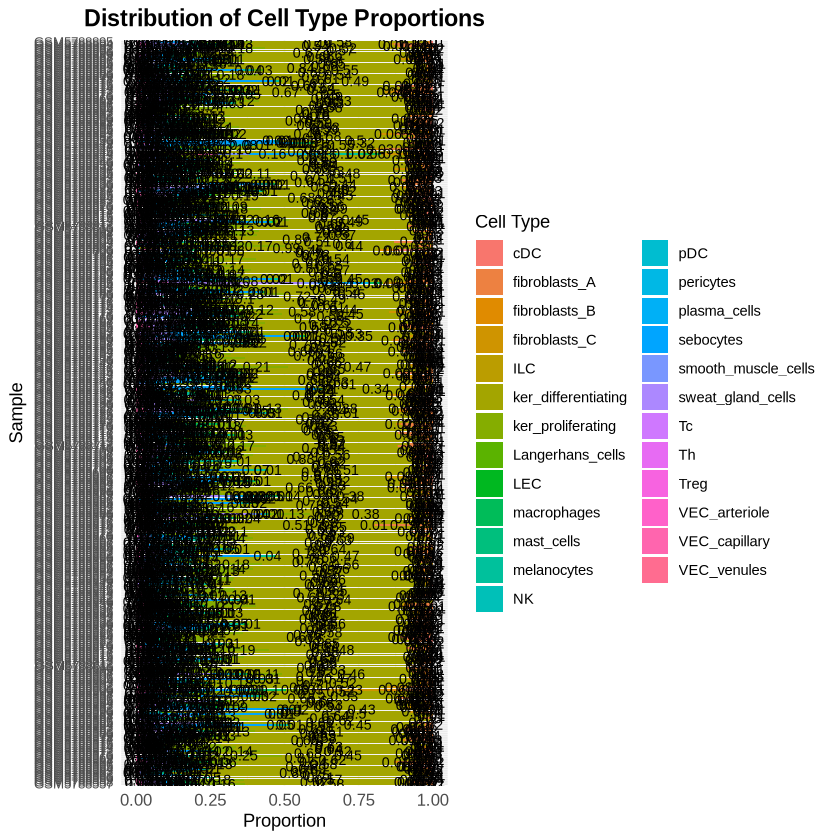

In [12]:
library(ggplot2)

ggplot(dwls.results.long, aes(x = Sample, y = dwls_fraction, fill = cell_type)) +
  geom_bar(stat = "identity") +
  geom_text(aes(
    label = ifelse(dwls_fraction > 0.005, round(dwls_fraction, 2), "") # Keine Anzeige für Nullen
  ),
  position = position_stack(vjust = 0.5), 
  size = 3, color = "black") +
  labs(
    title = "Distribution of Cell Type Proportions",
    x = "Sample",
    y = "Proportion",
    fill = "Cell Type"
  ) +
  coord_flip() +
  theme_minimal() +
  theme(
    axis.text.y = element_text(size = 8), 
    axis.text.x = element_text(size = 10),
    plot.title = element_text(hjust = 0.5, size = 14, face = "bold"),
    legend.position = "right"
  )


In [34]:
ggsave("stacked_barplot.png", width = 35, height = 35, dpi = 300, limitsize = FALSE)


In [33]:
omnideconv::plot_deconvolution(list('dwls' = deconvolution.results.dwls), "bar", "method", "Spectral")

Warning message in geom_col(tooltip):
“Ignoring unknown aesthetics: text”


HTML widgets cannot be represented in plain text (need html)

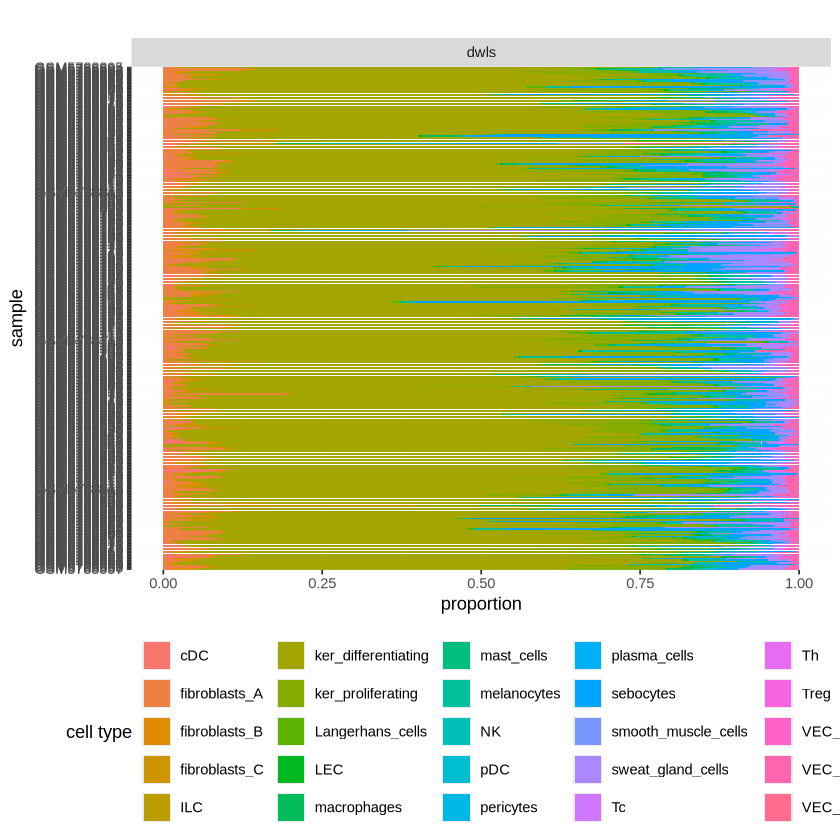

In [34]:
make_barplot(list('dwls' = deconvolution.results.dwls))

In [24]:
deconvolution.results.bayesprism <- deconvolute(bulk_gene_expression = bulk.data,
                                           single_cell_object = counts.matrix,
                                           cell_type_annotations = cell.type.annotations,
                                           method = 'bayesprism', 
                                           n_cores=40)

Warning message:
“replacing previous import ‘gplots::lowess’ by ‘stats::lowess’ when loading ‘BayesPrism’”
Warning message:
“replacing previous import ‘BiocParallel::register’ by ‘NMF::register’ when loading ‘BayesPrism’”


number of cells in each cell state 
cell.state.labels
                                        mast21b2ee377f8711ec9bf265fb9bf6ab9ccells 
                                                                                4 
                                                                              pDC 
                                                                               89 
                                      plasma21b2ee377f8711ec9bf265fb9bf6ab9ccells 
                                                                              121 
                                                                              cDC 
                                                                              200 
                                     fibroblasts21b2ee377f8711ec9bf265fb9bf6ab9cA 
                                                                              200 
                                     fibroblasts21b2ee377f8711ec9bf265fb9bf6ab9cB 
                                 

snowfall 1.84-6.3 initialized (using snow 0.4-4): parallel execution on 40 CPUs.



Stopping cluster




Update the reference matrix ... 


snowfall 1.84-6.3 initialized (using snow 0.4-4): parallel execution on 40 CPUs.



Stopping cluster




Run Gibbs sampling using updated reference ... 
Current time:  2024-11-20 20:54:52.42915 
Estimated time to complete:  1hrs 17mins 
Estimated finishing time:  2024-11-20 22:11:36.10915 
Start run... 


snowfall 1.84-6.3 initialized (using snow 0.4-4): parallel execution on 40 CPUs.



Stopping cluster




In [26]:
saveRDS(deconvolution.results.bayesprism,"/nfs/data/COST_IBD/data/atopic_dermatitis/deconvolution/Hu/deconvolution_results_bayesprism.rds")

In [13]:
deconvolution.results.bayesprism <- readRDS("deconvolution_results_bayesprism.rds")


In [36]:
omnideconv::plot_deconvolution(list('bayesprism' = deconvolution.results.bayesprism), "bar", "method", "Spectral")

Warning message in geom_col(tooltip):
“Ignoring unknown aesthetics: text”


HTML widgets cannot be represented in plain text (need html)

# Plots

In [1]:
deconvolution.results.bayesprism <- readRDS("deconvolution_results_bayesprism.rds")


In [2]:
deconvolution.results.dwls <- readRDS("deconvolution_results_dwls.rds")


── Attaching core tidyverse packages ──────────────────────── tidyverse 2.0.0 ──
✔ dplyr     1.1.4     ✔ readr     2.1.5
✔ forcats   1.0.0     ✔ stringr   1.5.1
✔ ggplot2   3.5.1     ✔ tibble    3.2.1
✔ lubridate 1.9.3     ✔ tidyr     1.3.1
✔ purrr     1.0.2     
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
ℹ Use the conflicted package (<http://conflicted.r-lib.org/>) to force all conflicts to become errors


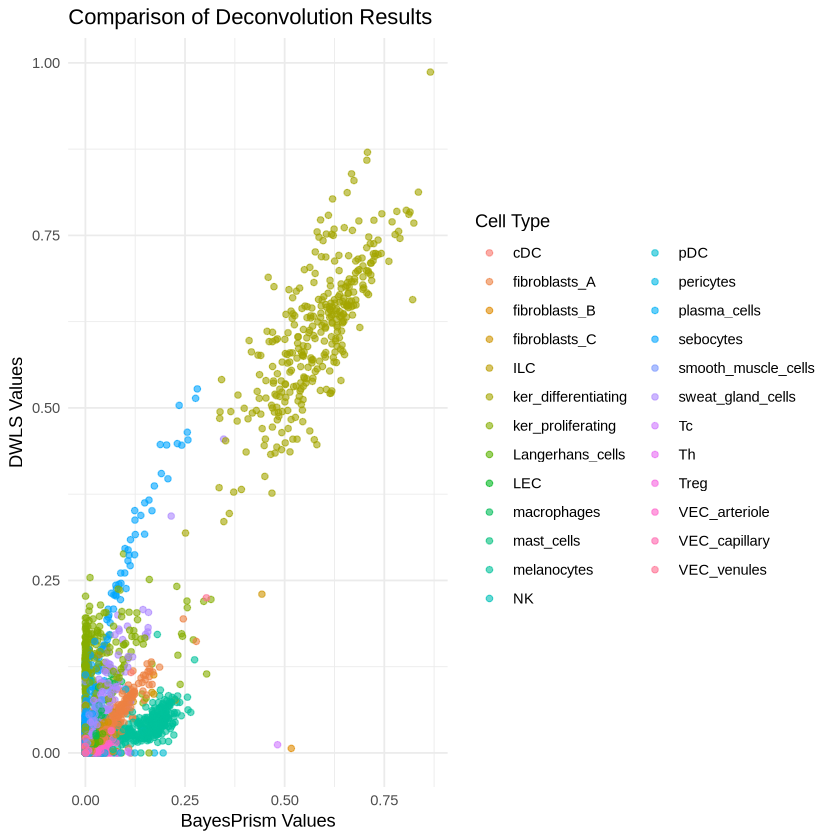

In [3]:
library(tidyverse)

bayesprism_df <- as.data.frame(deconvolution.results.bayesprism) %>%
  rownames_to_column(var = "Sample") %>%
  pivot_longer(cols = -Sample, names_to = "CellType", values_to = "BayesPrism")

dwls_df <- as.data.frame(deconvolution.results.dwls) %>%
  rownames_to_column(var = "Sample") %>%
  pivot_longer(cols = -Sample, names_to = "CellType", values_to = "DWLS")

combined_df <- left_join(bayesprism_df, dwls_df, by = c("Sample", "CellType"))

ggplot(combined_df, aes(x = BayesPrism, y = DWLS, color = CellType)) +
  geom_point(alpha = 0.6) + 
  theme_minimal() +
  labs(
    title = "Comparison of Deconvolution Results",
    x = "BayesPrism Values",
    y = "DWLS Values",
    color = "Cell Type"
  ) +
  theme(legend.position = "right") + 
  scale_fill_hue()


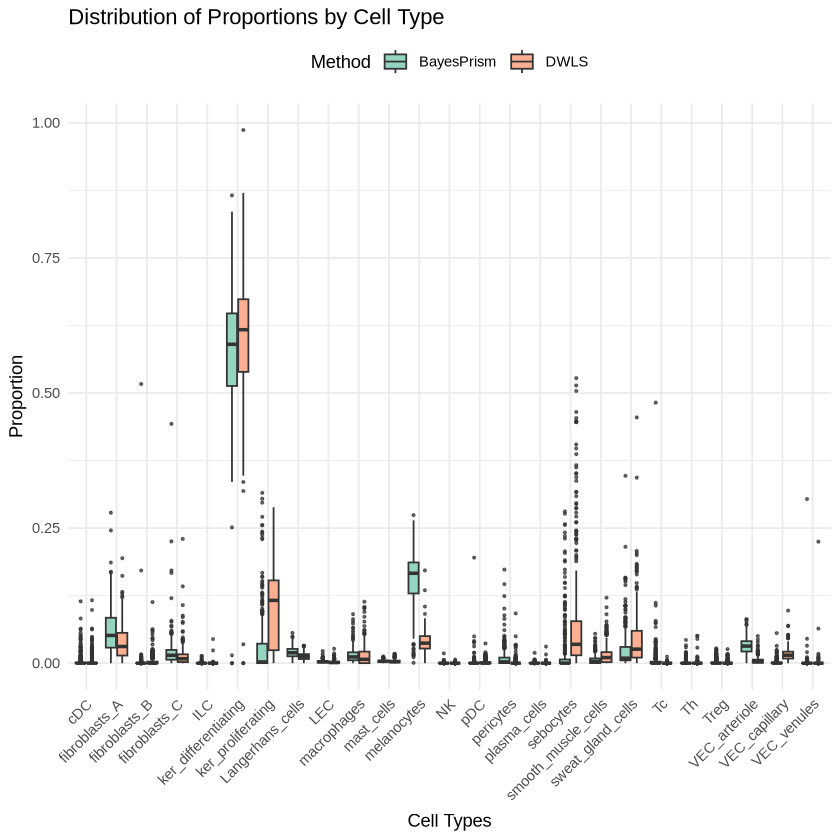

In [4]:
bayesprism_df <- as.data.frame(deconvolution.results.bayesprism) %>%
  rownames_to_column(var = "Sample") %>%
  pivot_longer(cols = -Sample, names_to = "CellType", values_to = "BayesPrism")

dwls_df <- as.data.frame(deconvolution.results.dwls) %>%
  rownames_to_column(var = "Sample") %>%
  pivot_longer(cols = -Sample, names_to = "CellType", values_to = "DWLS")

combined_df <- bind_rows(
  bayesprism_df %>% mutate(Method = "BayesPrism"),
  dwls_df %>% mutate(Method = "DWLS")
)

ggplot(combined_df, aes(x = CellType, y = if_else(Method == "BayesPrism", BayesPrism, DWLS), fill = Method)) +
  geom_boxplot(alpha = 0.7, outlier.size = 0.5) + 
  theme_minimal() + 
  labs(
    title = "Distribution of Proportions by Cell Type",
    x = "Cell Types",
    y = "Proportion",
    fill = "Method"
  ) +
  theme(
    axis.text.x = element_text(angle = 45, hjust = 1), 
    legend.position = "top" 
  ) +
  scale_fill_brewer(palette = "Set2") 


# Metadata Plot

## DWLS

In [5]:
dwls.results.long <- deconvolution.results.dwls %>%
     as.data.frame() %>%
     rownames_to_column(., 'Sample') %>%
     gather(., key = 'cell_type', value = 'dwls_fraction', -'Sample')

bayesprism.results.long <- deconvolution.results.bayesprism %>%
     as.data.frame() %>%
     rownames_to_column(., 'Sample') %>%
     gather(., key = 'cell_type', value = 'bayesprism_fraction', -'Sample')

results.long <- full_join(dwls.results.long, bayesprism.results.long)

Joining with `by = join_by(Sample, cell_type)`


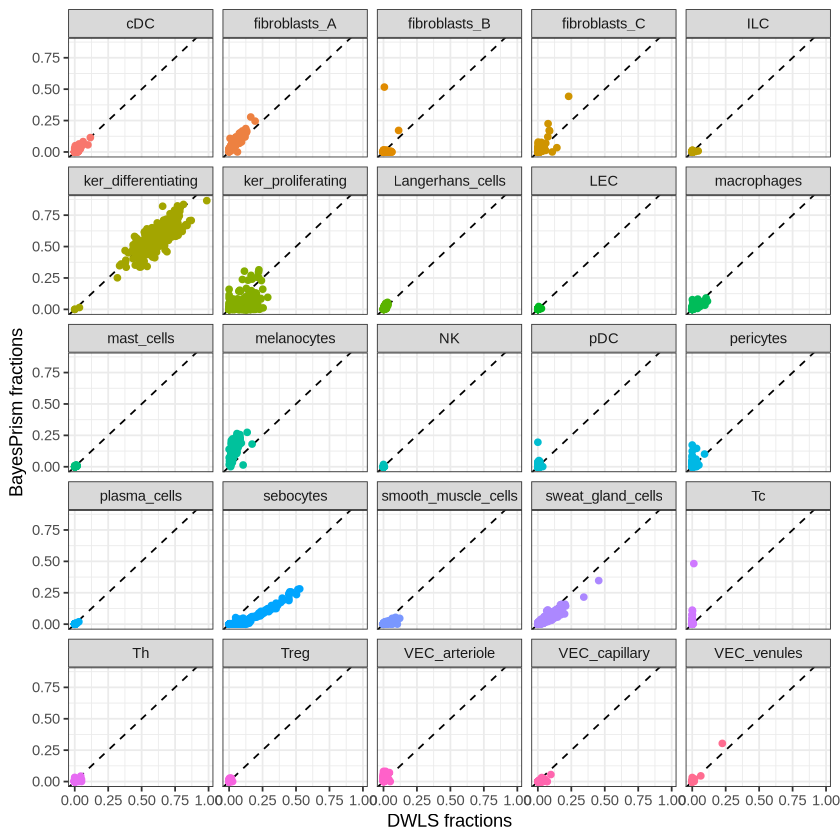

In [6]:
ggplot(results.long, aes(x = dwls_fraction, y = bayesprism_fraction)) +
  geom_abline(linetype = 'dashed') +
  geom_point(aes(color = cell_type)) +
  theme_bw()+
  theme(legend.position = 'hide') +
  facet_wrap(.~cell_type) +
  ylab('BayesPrism fractions')+
  xlab('DWLS fractions')

In [7]:
patient.metadata <- data <- read.csv("/nfs/data/COST_IBD/data/atopic_dermatitis/deconvolution/Hu/Metadata_Hu.csv", stringsAsFactors = FALSE)

In [8]:
head(patient.metadata)

,Run,anatomic_region,Assay.Type,AvgSpotLen,Bases,BioProject,BioSample,Bytes,Center.Name,Consent,⋯,version,Sample.Name,scorad,Skin_Type,source_name,SRA.Study,subject_id,tissue,Visit_Date,visit_id
,<chr>,<chr>,<chr>,<int>,<dbl>,<chr>,<chr>,<dbl>,<chr>,<chr>,⋯,<int>,<chr>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<int>
1,SRR17514123,arm,RNA-Seq,302,11753022184,PRJNA795775,SAMN24776198,3965656123,GEO,public,⋯,1,GSM5788557,48.0,LS,skin biopsy,SRP354132,AD_02,skin,21.03.2018,1
2,SRR17514124,arm,RNA-Seq,302,11706459824,PRJNA795775,SAMN24776199,3969264842,GEO,public,⋯,1,GSM5788558,67.6,LS,skin biopsy,SRP354132,AD_04,skin,10.04.2018,1
3,SRR17514125,arm,RNA-Seq,302,10869296194,PRJNA795775,SAMN24776200,3674736626,GEO,public,⋯,1,GSM5788559,67.6,NL,skin biopsy,SRP354132,AD_04,skin,10.04.2018,1
4,SRR17514126,hand,RNA-Seq,302,11242538900,PRJNA795775,SAMN24776201,3793539310,GEO,public,⋯,1,GSM5788560,28.9,LS,skin biopsy,SRP354132,AD_05,skin,10.04.2018,1
5,SRR17514127,hand,RNA-Seq,302,9856326284,PRJNA795775,SAMN24776202,3412469648,GEO,public,⋯,1,GSM5788561,28.9,LS,skin biopsy,SRP354132,AD_05,skin,10.04.2018,1
6,SRR17514128,arm,RNA-Seq,302,11224185152,PRJNA795775,SAMN24776203,3812423328,GEO,public,⋯,1,GSM5788562,28.9,NL,skin biopsy,SRP354132,AD_05,skin,10.04.2018,1


In [9]:
patient.metadata <- patient.metadata %>%
  select(Skin_Type, gender, scorad, easi, anatomic_region, Sample.Name)

In [10]:
head(patient.metadata)

,Skin_Type,gender,scorad,easi,anatomic_region,Sample.Name
,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>
1,LS,female,48.0,5.2,arm,GSM5788557
2,LS,female,67.6,22.3,arm,GSM5788558
3,NL,female,67.6,22.3,arm,GSM5788559
4,LS,female,28.9,1.4,hand,GSM5788560
5,LS,female,28.9,1.4,hand,GSM5788561
6,NL,female,28.9,1.4,arm,GSM5788562


In [11]:
assign_severity <- function(easi_score) {
  if (is.na(easi_score)) {
    return("healthy")  # Fehlende Werte bleiben NA
  } else if (easi_score >= 0 && easi_score <= 1) {
    return("clear")
  } else if (easi_score > 1 && easi_score <= 7) {
    return("mild")
  } else if (easi_score > 7 && easi_score <= 21) {
    return("moderate")
  } else if (easi_score > 21 && easi_score <= 50) {
    return("severe")
  } else {
    return("unknown")
  }
}

patient.metadata$severity <- sapply(patient.metadata$easi, assign_severity)

head(patient.metadata)



,Skin_Type,gender,scorad,easi,anatomic_region,Sample.Name,severity
,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,LS,female,48.0,5.2,arm,GSM5788557,mild
2,LS,female,67.6,22.3,arm,GSM5788558,severe
3,NL,female,67.6,22.3,arm,GSM5788559,severe
4,LS,female,28.9,1.4,hand,GSM5788560,mild
5,LS,female,28.9,1.4,hand,GSM5788561,mild
6,NL,female,28.9,1.4,arm,GSM5788562,mild


In [12]:
head(deconvolution.results.dwls)

,cDC,fibroblasts_A,fibroblasts_B,fibroblasts_C,ILC,ker_differentiating,ker_proliferating,Langerhans_cells,LEC,macrophages,⋯,plasma_cells,sebocytes,smooth_muscle_cells,sweat_gland_cells,Tc,Th,Treg,VEC_arteriole,VEC_capillary,VEC_venules
GSM5788557,-1.434376e-19,0.017260327,2.428750e-02,1.430248e-02,2.463569e-22,0.5772229,1.568067e-01,0.001459755,6.646393e-04,3.986306e-02,⋯,3.313536e-23,0.03534131,4.405653e-03,6.974823e-02,-4.359191e-20,-3.962297e-20,1.013166e-19,1.093076e-03,0.021069030,-2.767027e-20
GSM5788558,1.044652e-02,0.058932946,8.906388e-03,1.059169e-02,3.134161e-22,0.6230805,9.707283e-02,0.004916827,4.034905e-03,4.173779e-02,⋯,0.000000e+00,0.02009220,5.708624e-03,5.844405e-02,-1.836288e-20,1.708084e-18,1.550521e-03,3.254644e-04,0.017125869,-4.330953e-19
GSM5788559,-2.030607e-19,0.061079423,6.987000e-03,-5.010285e-23,9.709738e-21,0.5666400,1.831654e-01,0.009905431,5.276827e-04,1.685121e-02,⋯,-4.818325e-30,0.03845146,1.107712e-02,5.125847e-02,-1.028253e-19,-4.523719e-19,-7.525946e-20,1.200127e-03,0.015355671,4.301278e-19
GSM5788560,-3.277028e-19,0.014251408,-8.276596e-19,1.090019e-02,-3.652961e-19,0.7058774,3.720915e-08,0.001670766,1.581937e-04,-8.254383e-23,⋯,0.000000e+00,0.20850027,-1.345374e-19,3.973490e-03,4.677717e-18,-5.129432e-18,4.314185e-18,-5.468330e-20,0.001317975,-2.917316e-18
GSM5788561,3.325441e-19,0.008266924,3.424066e-18,1.200589e-02,2.106325e-20,0.7457179,6.881442e-02,0.002250747,1.756400e-22,4.458836e-10,⋯,-1.824501e-29,0.09662486,-8.653742e-20,1.943981e-02,2.191294e-18,1.557530e-18,1.359809e-18,8.645633e-09,0.014597590,1.647921e-19
GSM5788562,-7.846234e-19,0.030943261,3.845806e-19,1.031110e-02,-1.964584e-19,0.8589093,7.885214e-12,0.004471839,8.471964e-04,-2.652797e-21,⋯,1.212291e-30,0.03245168,4.271275e-03,-1.081705e-22,-3.867197e-18,7.902290e-18,3.746419e-18,4.710582e-03,0.006596479,1.214628e-18


In [13]:
table(duplicated(patient.metadata$Sample.Name))


FALSE  TRUE 
  339    22 

In [14]:
duplicates <- patient.metadata$Sample.Name[duplicated(patient.metadata$Sample.Name)]

unique(duplicates)


[1] "GSM5788874" "GSM5788875" "GSM5788876" "GSM5788877" "GSM5788878"
 [6] "GSM5788879" "GSM5788880" "GSM5788881" "GSM5788882" "GSM5788883"
[11] "GSM5788884" "GSM5788885" "GSM5788886" "GSM5788887" "GSM5788888"
[16] "GSM5788889" "GSM5788890" "GSM5788891" "GSM5788892" "GSM5788893"
[21] "GSM5788894" "GSM5788895"

In [15]:
duplicate_metadata <- patient.metadata[patient.metadata$Sample.Name %in% unique(duplicates), ]

head(duplicate_metadata)


,Skin_Type,gender,scorad,easi,anatomic_region,Sample.Name,severity
,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
158,LS,female,55.7,9.6,arm,GSM5788874,moderate
159,LS,female,55.7,9.6,arm,GSM5788874,moderate
160,NL,female,45.2,1.5,arm,GSM5788875,mild
321,NL,female,45.2,1.5,arm,GSM5788875,mild
322,LS,male,32.0,4.6,back_of_knee,GSM5788876,mild
323,LS,male,32.0,4.6,back_of_knee,GSM5788876,mild


In [16]:
patient.metadata <- patient.metadata[!duplicated(patient.metadata$Sample.Name), ]

head(patient.metadata)


,Skin_Type,gender,scorad,easi,anatomic_region,Sample.Name,severity
,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>
1,LS,female,48.0,5.2,arm,GSM5788557,mild
2,LS,female,67.6,22.3,arm,GSM5788558,severe
3,NL,female,67.6,22.3,arm,GSM5788559,severe
4,LS,female,28.9,1.4,hand,GSM5788560,mild
5,LS,female,28.9,1.4,hand,GSM5788561,mild
6,NL,female,28.9,1.4,arm,GSM5788562,mild


In [30]:
deconvolution.results.dwls <- readRDS("deconvolution_results_dwls.rds")

In [17]:
patients.results <- rownames_to_column(as.data.frame(deconvolution.results.dwls), var = "Sample.Name") %>%
  gather(key = 'celltype', value = 'cell_fraction', -Sample.Name) %>%
  left_join(patient.metadata, by = "Sample.Name")

head(patients.results)


,Sample.Name,celltype,cell_fraction,Skin_Type,gender,scorad,easi,anatomic_region,severity
,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>
1,GSM5788557,cDC,-1.434376e-19,LS,female,48.0,5.2,arm,mild
2,GSM5788558,cDC,1.044652e-02,LS,female,67.6,22.3,arm,severe
3,GSM5788559,cDC,-2.030607e-19,NL,female,67.6,22.3,arm,severe
4,GSM5788560,cDC,-3.277028e-19,LS,female,28.9,1.4,hand,mild
5,GSM5788561,cDC,3.325441e-19,LS,female,28.9,1.4,hand,mild
6,GSM5788562,cDC,-7.846234e-19,NL,female,28.9,1.4,arm,mild


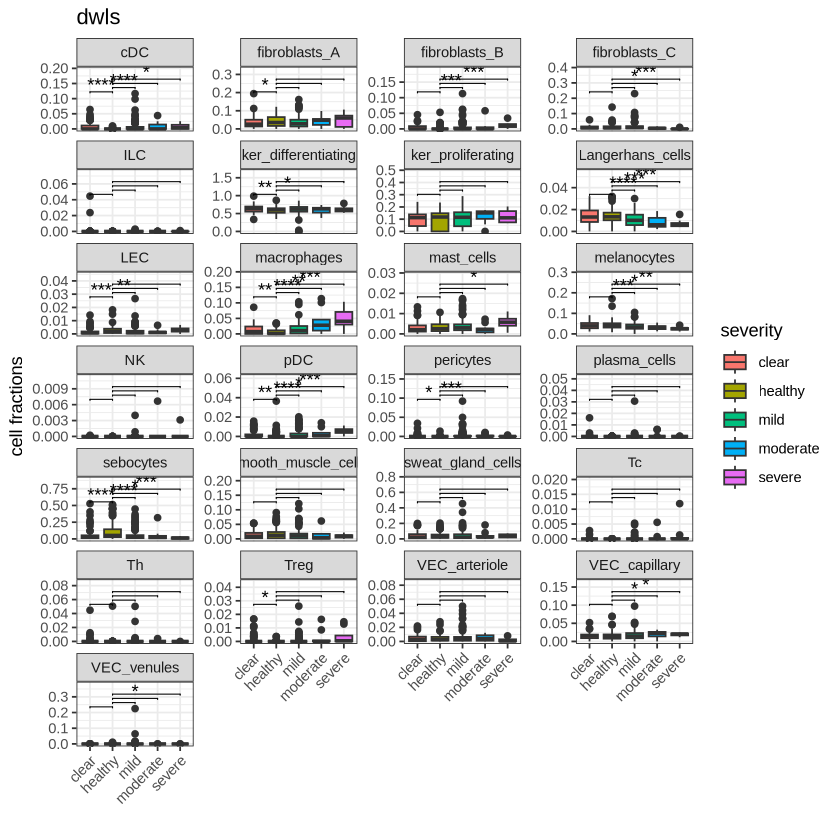

In [25]:
comparisons <- list(
  c("healthy", "clear"),
  c("healthy", "mild"),
  c("healthy", "moderate"),
  c("healthy", "severe")
)
ggplot(patients.results, 
       aes(x = severity, y = cell_fraction, fill = severity)) +
  geom_boxplot() +
  facet_wrap(.~celltype, scales = 'free_y', ncol = 4) +
  ylab('cell fractions') +
  xlab('') +
  theme_bw() +
  ggtitle("dwls") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  stat_compare_means(method = "wilcox.test", 
                     label = "p.signif", 
                     hide.ns = TRUE, 
                     comparisons = comparisons,
                     p.adjust.method = "fdr") +  
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.25)))

In [28]:
ggsave("dwls_severity.png", width = 10, height = 11,units = "in", dpi = 300, limitsize = FALSE)

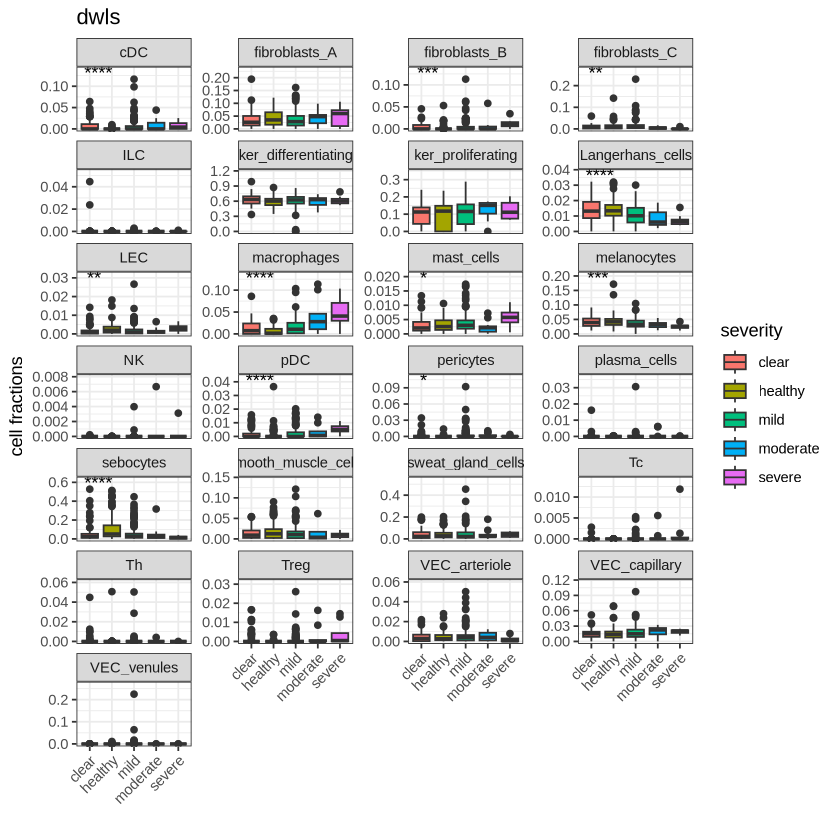

In [26]:
ggplot(patients.results, 
       aes(x = severity, y = cell_fraction, fill = severity)) +
  geom_boxplot() +
  facet_wrap(.~celltype, scales = 'free_y', ncol = 4) +
  ylab('cell fractions') +
  xlab('') +
  theme_bw() +
  ggtitle("dwls") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  stat_compare_means(label = "p.signif", method = "kruskal.test", hide.ns = TRUE) +
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.25)))

In [30]:
ggsave("dwls_severity_all.png", width = 10, height = 11,units = "in", dpi = 300, limitsize = FALSE)

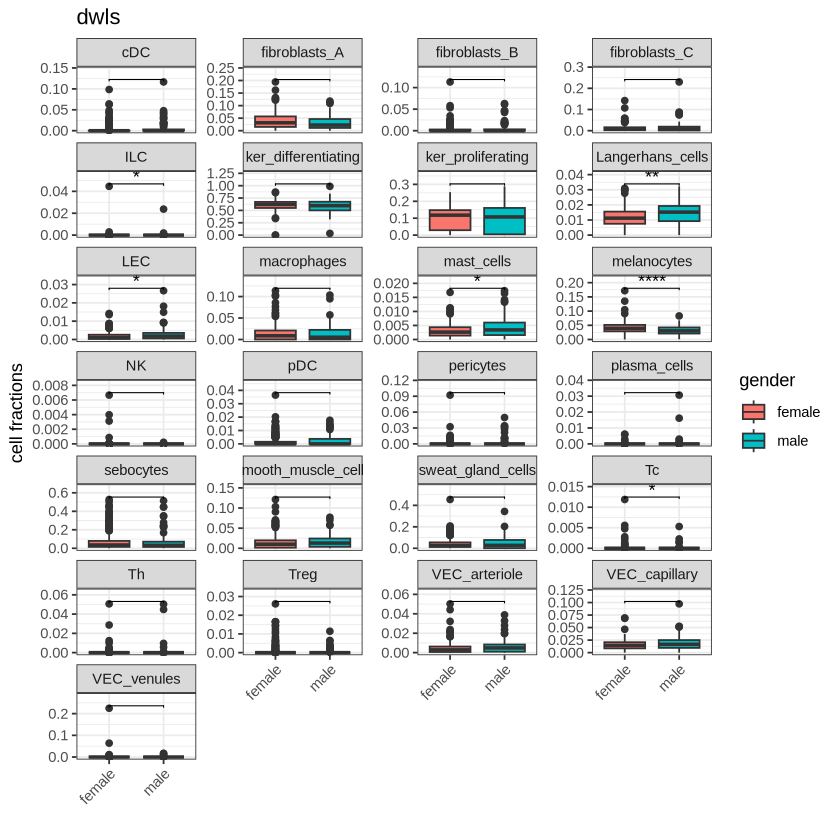

In [27]:
ggplot(patients.results, 
       aes(x = gender, y = cell_fraction, fill = gender)) +
  geom_boxplot() +
  facet_wrap(.~celltype, scales = 'free_y', ncol = 4) +
  ylab('cell fractions') +
  xlab('') +
  theme_bw() +
  ggtitle("dwls") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  stat_compare_means(label='p.signif', method = "wilcox.test",
                     comparisons = list(c("female", "male")), 
                     hide.ns = TRUE) +
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.25)))

In [32]:
ggsave("dwls_severity_gender.png", width = 10, height = 11,units = "in", dpi = 300, limitsize = FALSE)

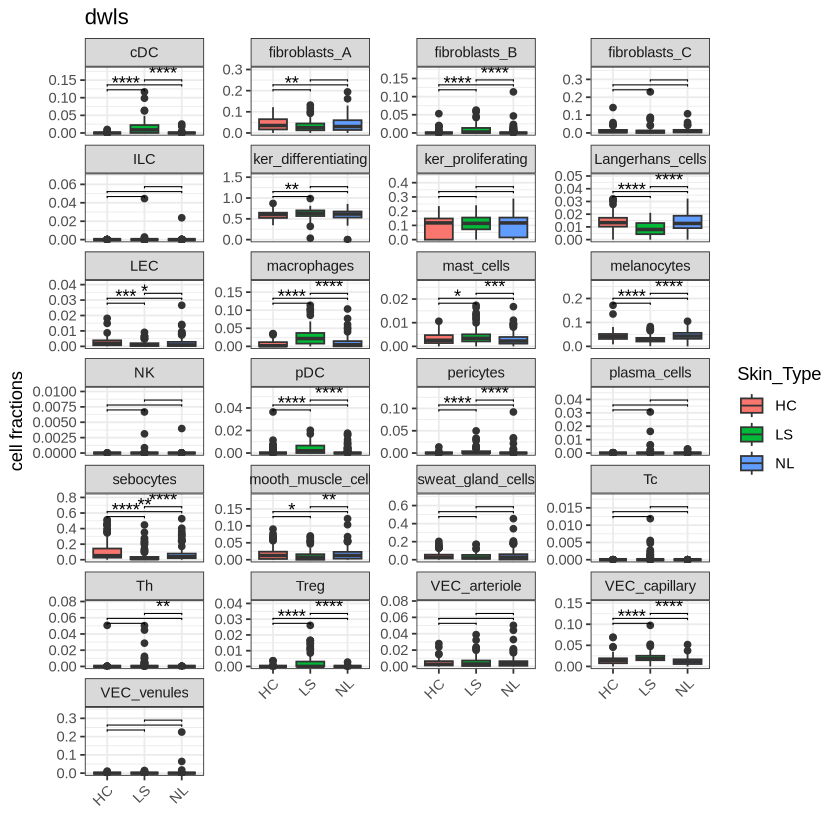

In [28]:
pairwise_comparisons <- list(
  c("HC", "LS"),
  c("HC", "NL"),
  c("LS", "NL")
)

ggplot(patients.results, 
       aes(x = Skin_Type, y = cell_fraction, fill = Skin_Type)) +
  geom_boxplot() +
  facet_wrap(.~celltype, scales = 'free_y', ncol = 4) +
  ylab('cell fractions') +
  xlab('') +
  ggtitle("dwls") +
  theme_bw() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  stat_compare_means(comparisons = pairwise_comparisons, 
                     label = "p.signif", 
                     method = "wilcox.test",
                     hide.ns = TRUE) +  
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.25)))


In [34]:
ggsave("dwls_skin_type.png", width = 10, height = 11,units = "in", dpi = 300, limitsize = FALSE)

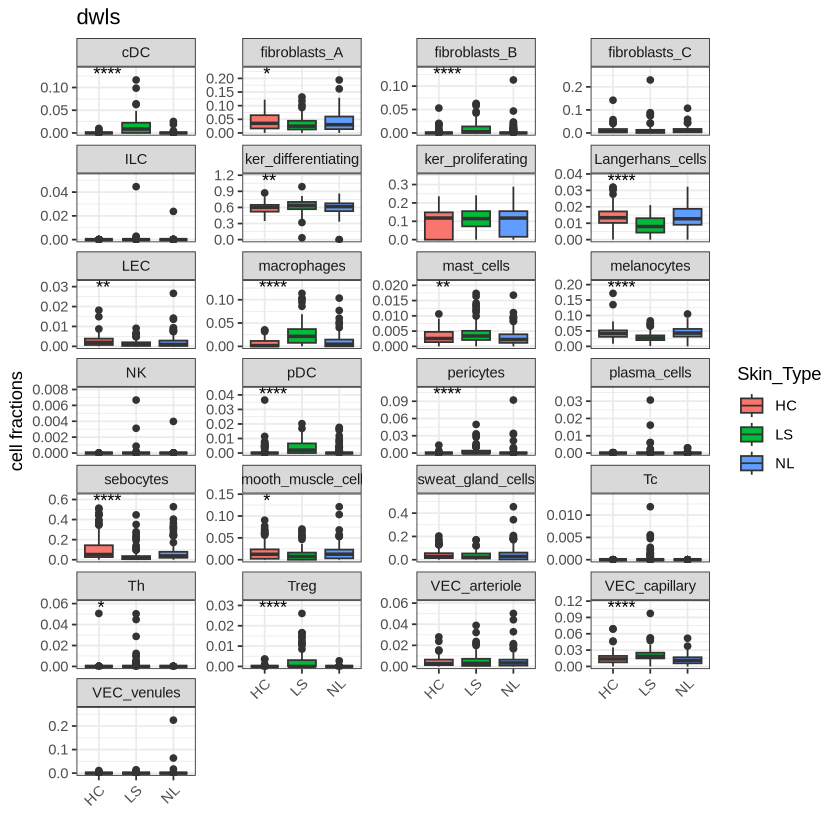

In [29]:
ggplot(patients.results, 
       aes(x = Skin_Type, y = cell_fraction, fill = Skin_Type)) +
  geom_boxplot() +
  facet_wrap(.~celltype, scales = 'free_y', ncol = 4) +
  ylab('cell fractions') +
  xlab('') +
  theme_bw() +
  ggtitle("dwls") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  stat_compare_means(label = "p.signif", method = "kruskal.test", hide.ns = TRUE) +
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.25)))

In [36]:
ggsave("dwls_skin_type_all.png", width = 10, height = 11,units = "in", dpi = 300, limitsize = FALSE)

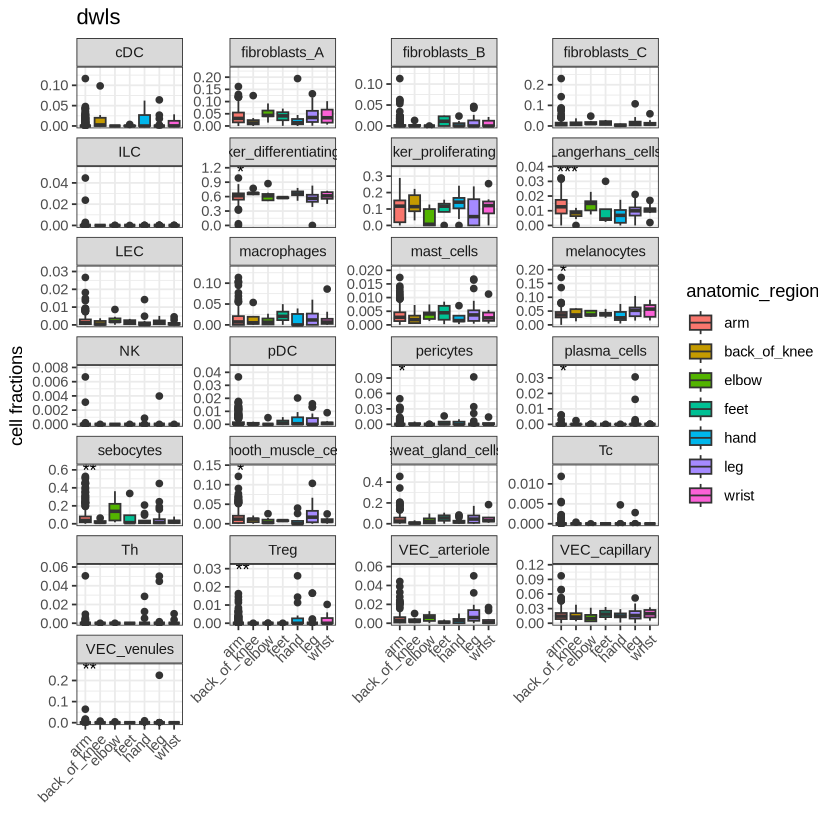

In [30]:
ggplot(patients.results, 
       aes(x = anatomic_region, y = cell_fraction, fill = anatomic_region)) +
  geom_boxplot() +
  facet_wrap(.~celltype, scales = 'free_y', ncol = 4) +
  ylab('cell fractions') +
  xlab('') +
  theme_bw() +
  ggtitle("dwls") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  stat_compare_means(label = "p.signif", method = "kruskal.test", hide.ns = TRUE) +
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.25)))

In [38]:
ggsave("dwls_anatomic_region.png", width = 10, height = 11,units = "in", dpi = 300, limitsize = FALSE)

## bayesprism

In [31]:
patients.results.bayesprism <- rownames_to_column(as.data.frame(deconvolution.results.bayesprism), var = "Sample.Name") %>%
  gather(key = 'celltype', value = 'cell_fraction', -Sample.Name) %>%
  left_join(patient.metadata, by = "Sample.Name")

head(patients.results.bayesprism)

,Sample.Name,celltype,cell_fraction,Skin_Type,gender,scorad,easi,anatomic_region,severity
,<chr>,<chr>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<chr>,<chr>
1,GSM5788557,cDC,2.899225e-03,LS,female,48.0,5.2,arm,mild
2,GSM5788558,cDC,1.131438e-02,LS,female,67.6,22.3,arm,severe
3,GSM5788559,cDC,6.634596e-07,NL,female,67.6,22.3,arm,severe
4,GSM5788560,cDC,6.517104e-07,LS,female,28.9,1.4,hand,mild
5,GSM5788561,cDC,2.854987e-07,LS,female,28.9,1.4,hand,mild
6,GSM5788562,cDC,5.168512e-07,NL,female,28.9,1.4,arm,mild


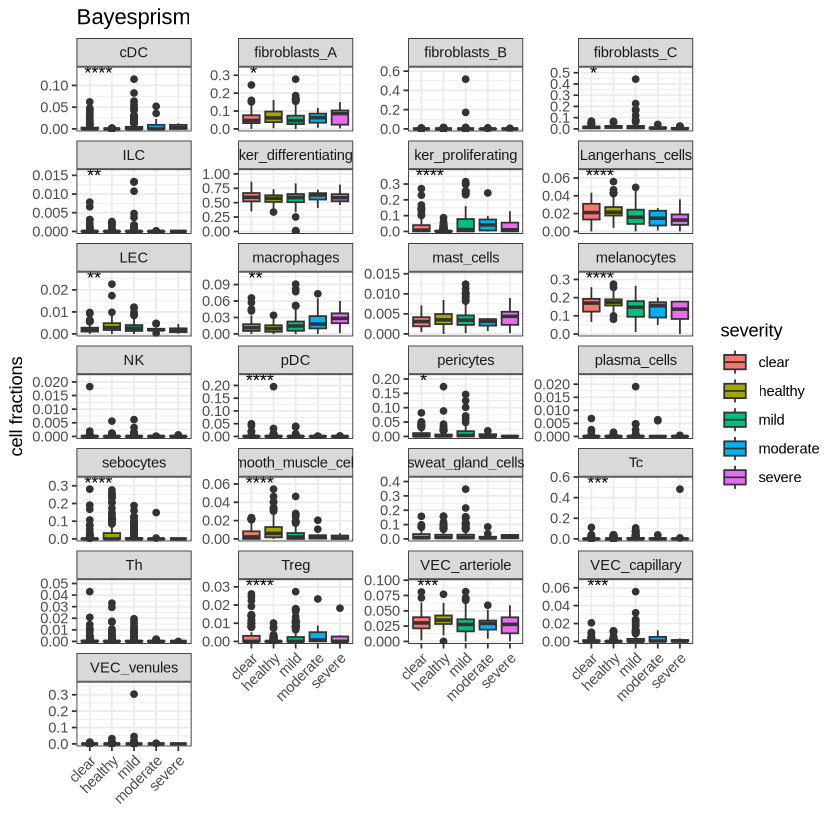

In [32]:
ggplot(patients.results.bayesprism, 
       aes(x = severity, y = cell_fraction, fill = severity)) +
  geom_boxplot() +
  facet_wrap(.~celltype, scales = 'free_y', ncol = 4) +
  ylab('cell fractions') +
  xlab('') +
  theme_bw() +
  ggtitle("Bayesprism") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  stat_compare_means(label = "p.signif", method = "kruskal.test", hide.ns = TRUE) +
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.25)))

In [41]:
ggsave("bayesprism_severity_all.png", width = 10, height = 11,units = "in", dpi = 300, limitsize = FALSE)

In [33]:
comparisons <- list(
  c("healthy", "clear"),
  c("healthy", "mild"),
  c("healthy", "moderate"),
  c("healthy", "severe")
)
bayesprism_severity <- ggplot(patients.results.bayesprism, 
       aes(x = severity, y = cell_fraction, fill = severity)) +
  geom_boxplot() +
  facet_wrap(.~celltype, scales = 'free_y', ncol = 4) +
  ylab('cell fractions') +
  xlab('') +
  theme_bw() +
  ggtitle("Bayesprism") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  stat_compare_means(method = "wilcox.test", 
                     label = "p.signif", 
                     hide.ns = TRUE, 
                     comparisons = comparisons,
                     p.adjust.method = "fdr") +  
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.25)))


In [52]:
ggsave("bayesprism_severity.png", width = 10, height = 12,units = "in", dpi = 300, limitsize = FALSE)

In [34]:
ggplot(pdc_results, 
       aes(x = severity, y = cell_fraction, fill = severity)) +
  geom_boxplot(outlier.shape = NA, alpha = 0.7, width = 0.6) +
  geom_jitter(width = 0.2, size = 1, alpha = 0.5) +
  ylab('cell fractions') +
  xlab('') +
  theme_bw() +
  ggtitle("pDC - dwls") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  stat_compare_means(method = "wilcox.test", 
                     label = "p.signif", 
                     hide.ns = TRUE, 
                     comparisons = comparisons,
                     p.adjust.method = "fdr") + 
  coord_cartesian(ylim = c(0, 0.04))  

ERROR: Error: object 'pdc_results' not found


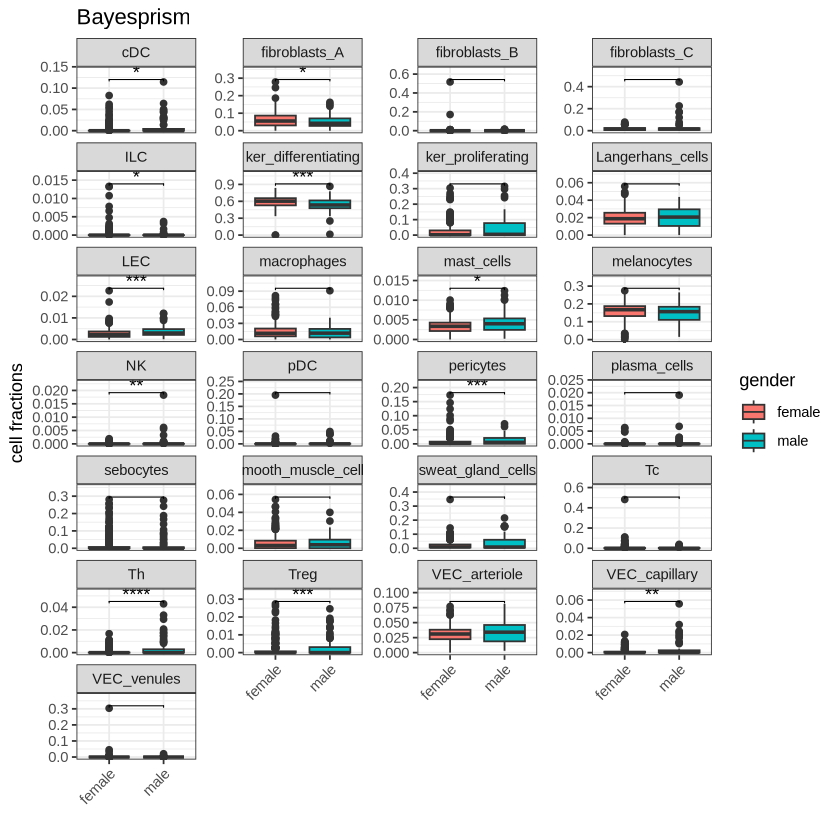

In [35]:
ggplot(patients.results.bayesprism, 
       aes(x = gender, y = cell_fraction, fill = gender)) +
  geom_boxplot() +
  facet_wrap(.~celltype, scales = 'free_y', ncol = 4) +
  ylab('cell fractions') +
  xlab('') +
  theme_bw() +
  ggtitle("Bayesprism") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  stat_compare_means(label='p.signif', method = "wilcox.test",
                     comparisons = list(c("female", "male")), 
                     hide.ns = TRUE) +
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.25)))

In [54]:
ggsave("bayesprism_gender.png", width = 10, height = 12,units = "in", dpi = 300, limitsize = FALSE)

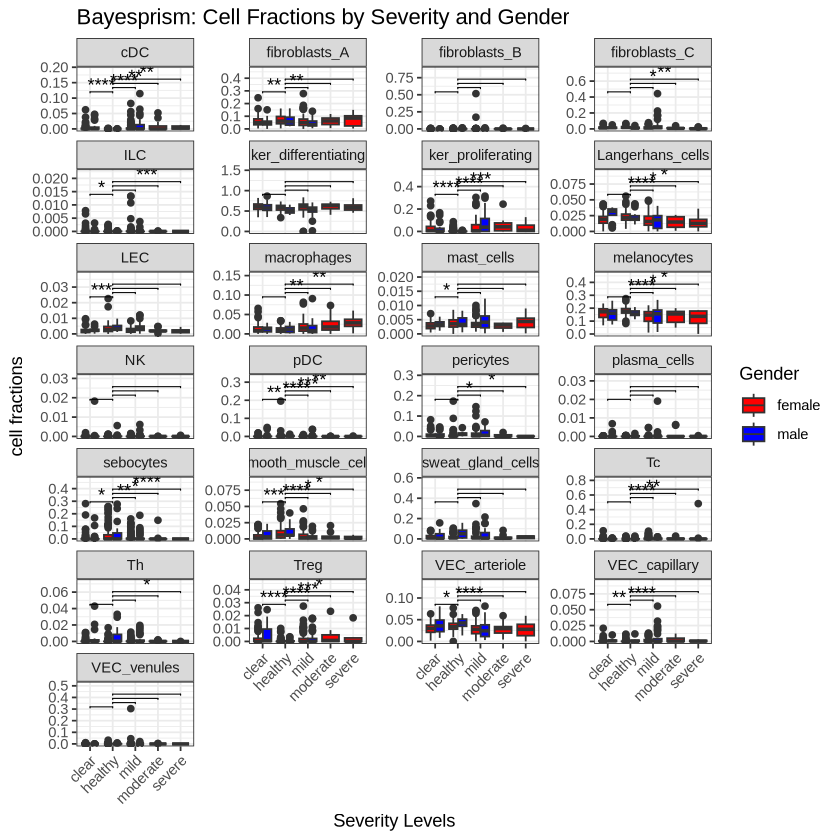

In [38]:
ggplot(patients.results.bayesprism, 
       aes(x = severity, y = cell_fraction, fill = gender)) +
  geom_boxplot(position = position_dodge(width = 0.8)) +
  facet_wrap(.~celltype, scales = 'free_y', ncol = 4) +
  ylab('cell fractions') +
  xlab('Severity Levels') +
  theme_bw() +
  ggtitle("Bayesprism: Cell Fractions by Severity and Gender") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  stat_compare_means(aes(group = gender), 
                     method = "wilcox.test", 
                     label = "p.signif", 
                     hide.ns = TRUE, 
                     comparisons = comparisons,
                     p.adjust.method = "fdr") +  
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.25))) +
  scale_fill_manual(values = c("female" = "red", "male" = "blue")) +
  labs(fill = "Gender")


In [39]:
ggsave("bayesprism_gender_severity.png", width = 10, height = 12,units = "in", dpi = 300, limitsize = FALSE)

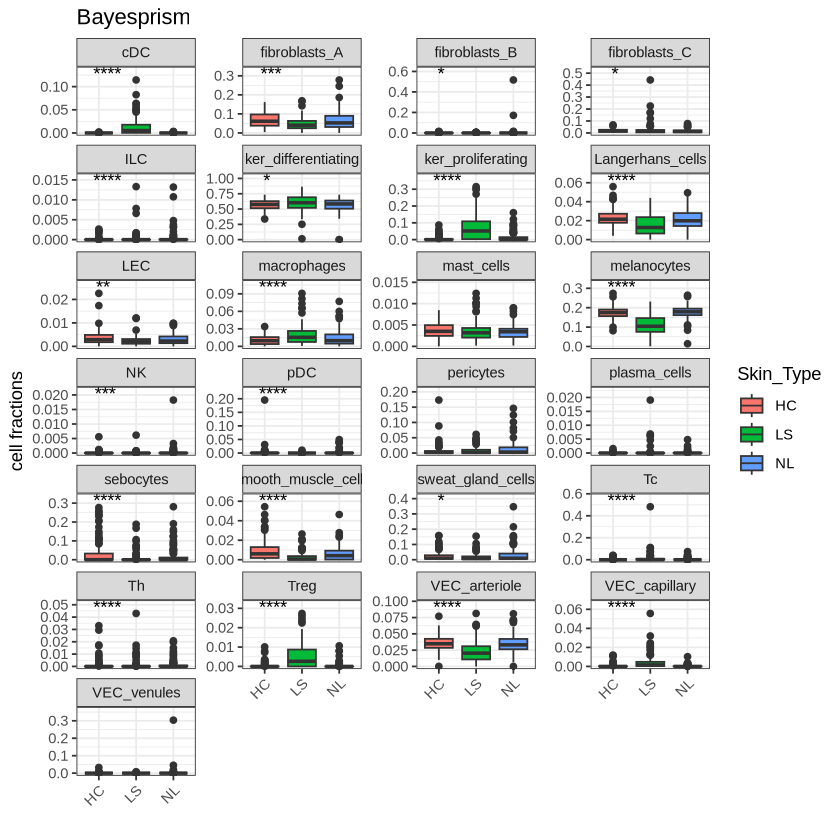

In [55]:
ggplot(patients.results.bayesprism, 
       aes(x = Skin_Type, y = cell_fraction, fill = Skin_Type)) +
  geom_boxplot() +
  facet_wrap(.~celltype, scales = 'free_y', ncol = 4) +
  ylab('cell fractions') +
  xlab('') +
  ggtitle("Bayesprism") +
  theme_bw() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  stat_compare_means(label = "p.signif", method = "kruskal.test", hide.ns = TRUE) +
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.25)))

In [56]:
ggsave("bayesprism_skin_type_all.png", width = 10, height = 12,units = "in", dpi = 300, limitsize = FALSE)

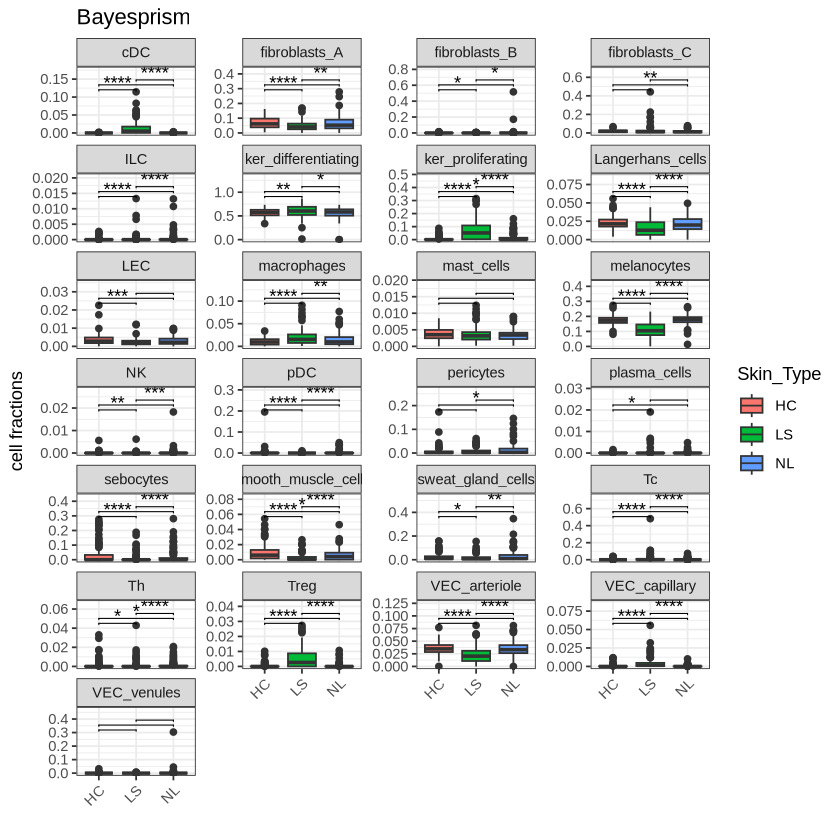

In [57]:
pairwise_comparisons <- list(
  c("HC", "LS"),
  c("HC", "NL"),
  c("LS", "NL")
)

ggplot(patients.results.bayesprism, 
       aes(x = Skin_Type, y = cell_fraction, fill = Skin_Type)) +
  geom_boxplot() +
  facet_wrap(.~celltype, scales = 'free_y', ncol = 4) +
  ylab('cell fractions') +
  xlab('') +
  ggtitle("Bayesprism") +
  theme_bw() +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  stat_compare_means(comparisons = pairwise_comparisons, 
                     label = "p.signif", 
                     method = "wilcox.test",
                     hide.ns = TRUE) +  
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.25)))


In [58]:
ggsave("bayesprism_skin_type.png", width = 10, height = 12,units = "in", dpi = 300, limitsize = FALSE)

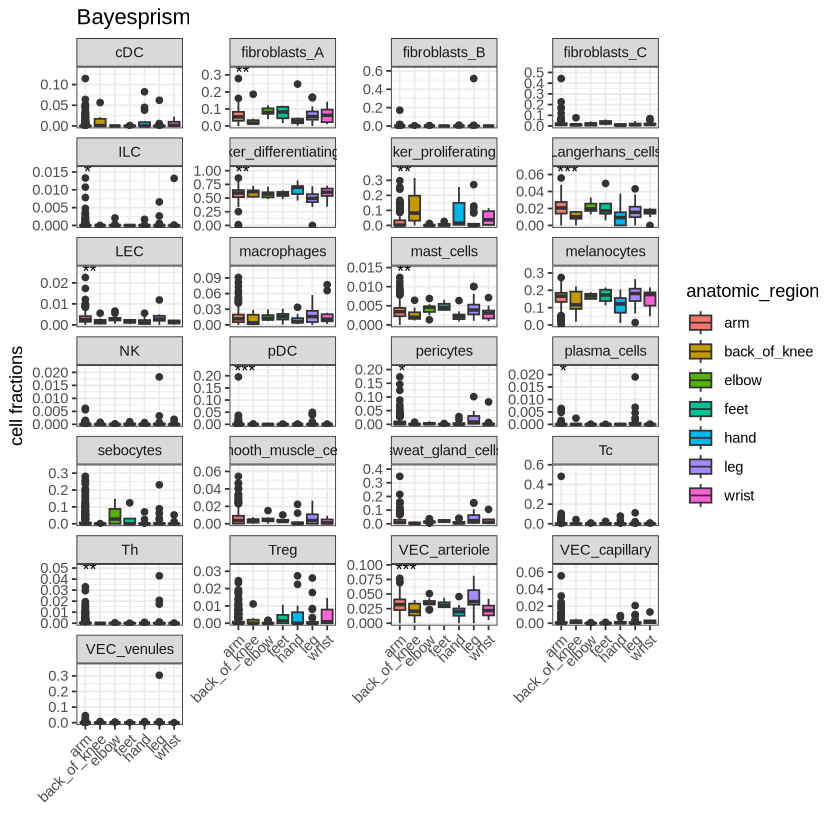

In [59]:
ggplot(patients.results.bayesprism, 
       aes(x = anatomic_region, y = cell_fraction, fill = anatomic_region)) +
  geom_boxplot() +
  facet_wrap(.~celltype, scales = 'free_y', ncol = 4) +
  ylab('cell fractions') +
  xlab('') +
  theme_bw() +
  ggtitle("Bayesprism") +
  theme(axis.text.x = element_text(angle = 45, hjust = 1)) +
  stat_compare_means(label = "p.signif", method = "kruskal.test", hide.ns = TRUE) +
  scale_y_continuous(expand = expansion(mult = c(0.05, 0.25)))

In [60]:
ggsave("bayesprism_anatomic_region.png", width = 10, height = 12,units = "in", dpi = 300, limitsize = FALSE)